# Import, Clean, and Explore Dataset
Date Last Update: 2021-08-11

In [2]:
from pandas_profiling import ProfileReport
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import datetime
import math
from matplotlib import pyplot as plt


In [3]:
# Load the data
#raw_data = pd.read_csv('/Users/lcags/Documents/Practicum2/DATA/max-entry-for-bb100-bb100-project-QueryResult_Reduced.csv')
raw_data = pd.read_csv('/Users/lcags/Documents/Practicum2/DATA/BB100_FullData.csv')


In [4]:
pprofile = ProfileReport(raw_data)

pprofile

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Exploration Notes

**Univariate Notes**
* weekid: Use to make seasons, drop in final. Use Year to make decade.
* week_position: Last position on chart before dropping, drop
* song: useful for data visualization, not for classification. Drop
* performer useful for data visualization, not for classification. Drop 
* weeks_on_chart use to determine longevity. Median = 10, Q3 = 16. 
* peak_position: Use to get top 10 hits.
* Spotify_Track_Duration: Missing values. Normal distribution.
* Spotify_Track_Explicit: Missing values. Skewed towards "False". Does not necessarily denote whether the song on the chart was explicit, this is just the entry found from Spotify API. Drop.
* Dancebility: Missing values. Normal looking distribution. Range between 0.1 and 0.9.
* Energy: Left skewed, songs tend to have more energy. Values between 0.1 and 0.9.
* Key: Missing values. Value between 0 and 10. Bimodal.
* Loudness: Slight left skew. Missing values. Value from -18 through -0.4.
* Mode: Missing values. Skews towards True. 60% of the values are true. Mode is major or minor key.
* Speechiness: Missing values. Extreme right skew. Values from 0.02 through .9
* Acoustiness:  Missing values. Extreme right skew. Values from 0.000002 through .9
* Instrumentalness: Missing values. Large amounts of the values are 0. Drop.
* Liveness: Missing values. Right skew. 0.02 through .9
* Valence: Missing values. Slight left skew.  0.03 through .9
* Tempo: Missing values. Right skew, bimodal. 59 through 213. Rescale?
* Time Signature: Missing values. 95% of the values are 4/4 time signature. Drop.

**Correlations** 

* Energy is highly correlated with both loudness and acousticness. 

* Dancebility is highly correlated to tempo and time signature. 

* Weeks on Chart and Peak Position are positively correlated: The longer a song has been on the chart, the higher the peak the position.

**Immediate Drops**

* Danceability, Energy, Spotify_Track_Explicit, Week_Position

**Missing Values** 
* According to missing value heatmap, if a song is missing one of the spotify values, it's missing all of them. All the missing values are correlated with each other. Drop only the rows that contain no Spotify data since it does not make sense to try to make up values for the entire entrie with chart data and no spotify data whatsoever.


In [99]:
raw_data = raw_data.dropna()

In [65]:
# go back to what i was doing before
raw_data = raw_data.drop(['danceability'
                          ,'energy'
                          ,'spotify_track_explicit'
                          ,'week_position']
                         ,axis=1)

In [66]:
raw_data.shape

(24329, 16)

In [67]:
raw_data

,weekid,song,performer,weeks_on_chart,peak_position,spotify_track_duration_ms,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,2009-12-26,My Life Would Suck Without You,Glee Cast,1,51,211800.0,9.0,-6.284,True,0.0348,0.01770,0.000000,0.0801,0.449,145.078,4.0
1,2014-01-04,I Have Nothing,Tessanne Chin,1,51,231141.0,9.0,-3.517,False,0.0338,0.23500,0.000000,0.0972,0.197,154.247,3.0
4,2019-06-01,I Think,"Tyler, The Creator",1,51,212013.0,8.0,-8.241,False,0.0801,0.00881,0.000000,0.1290,0.431,121.075,4.0
5,2019-09-07,I Think He Knows,Taylor Swift,1,51,173386.0,0.0,-8.029,True,0.0569,0.00889,0.000353,0.0715,0.416,100.003,4.0
6,2020-05-16,Losses,Drake,1,51,271183.0,1.0,-7.385,False,0.3510,0.28000,0.000000,0.4240,0.505,85.687,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29489,1979-03-31,One Way Love,Bandit,4,77,207386.0,0.0,-11.360,False,0.0475,0.15700,0.000095,0.1590,0.946,117.567,4.0
29490,1962-07-28,Sweet And Lovely,April Stevens & Nino Tempo,4,77,175533.0,10.0,-11.804,True,0.0396,0.61700,0.000000,0.3060,0.865,121.928,4.0
29491,1963-01-26,Darkest Street In Town,Jimmy Clanton,4,77,139760.0,5.0,-7.354,False,0.0394,0.41700,0.000000,0.0897,0.975,147.778,4.0
29494,1964-04-11,Roll Over Beethoven,The Beatles,4,68,165466.0,2.0,-9.435,True,0.0628,0.28900,0.000000,0.0952,0.967,160.673,4.0


### Add flags for peak position and long lasting
Top 10 is based on if the song peaked in the top 10 and longevity is based on the Q3 of the distribution of the datta.

In [51]:
raw_data['top_ten'] = np.where(raw_data['peak_position']<=10, 1, 0)
raw_data['long_lasting'] = np.where(raw_data['weeks_on_chart']>=5,1,0)

### Add Seasons

In [52]:
#Function to convert week to seasons

def makeseason(week_id):
    
    mdate = datetime.datetime.strptime(week_id, "%Y-%m-%d")
    
    if mdate.month >= 12:
        season = "winter"
    elif mdate.month >= 9:
        season = "fall"
    elif mdate.month >= 6:
        season = "summer"
    elif mdate.month >= 3:
        season= "spring"
    else:
        season = "winter"
    
    return season

In [53]:
raw_data["season"] = raw_data["weekid"].apply(makeseason)

### Add Decade

In [54]:
def make_decade(week_id):
    mdate = datetime.datetime.strptime(week_id, "%Y-%m-%d")
    decade = math.floor(mdate.year/10)*10
    return(decade)

In [55]:
raw_data["decade"] = raw_data["weekid"].apply(make_decade)

### Year 

In [56]:
#make year delete if keeping with decade
def make_year(week_id):
    mdate = datetime.datetime.strptime(week_id, "%Y-%m-%d")
    return(mdate.year)

In [57]:
raw_data["year"] = raw_data["weekid"].apply(make_year)

### Export Dataset Here

In [58]:
#For tableau viz
raw_data.to_csv(r'/Users/lcags/Documents/Practicum2/DATA/raw_data_visualization.csv'
                ,index = False
                ,header=True)

# Additional cleaning for ML prep

### Scale the columns that have much larger ranges
All features will be between 0 and 1.

In [59]:
scaler = MinMaxScaler()

In [28]:
raw_data[['spotify_track_duration_ms']]=scaler.fit_transform(raw_data[['spotify_track_duration_ms']])
raw_data[['key']]=scaler.fit_transform(raw_data[['key']])
raw_data[['peak_position']]=scaler.fit_transform(raw_data[['peak_position']])
raw_data[['weeks_on_chart']]=scaler.fit_transform(raw_data[['weeks_on_chart']])
raw_data[['loudness']]=scaler.fit_transform(raw_data[['loudness']])
raw_data[['tempo']]=scaler.fit_transform(raw_data[['tempo']])

In [29]:
raw_data

,weekid,song,performer,weeks_on_chart,peak_position,spotify_track_duration_ms,key,loudness,mode,speechiness,...,instrumentalness,liveness,valence,tempo,time_signature,top_ten,long_lasting,season,decade,year
0,2009-12-26,My Life Would Suck Without You,Glee Cast,0.000000,0.505051,0.059719,0.818182,0.717193,True,0.0348,...,0.000000,0.0801,0.449,0.601961,4.0,0,0,winter,2000,2009
1,2014-01-04,I Have Nothing,Tessanne Chin,0.000000,0.505051,0.066062,0.818182,0.808450,False,0.0338,...,0.000000,0.0972,0.197,0.640005,3.0,0,0,winter,2010,2014
4,2019-06-01,I Think,"Tyler, The Creator",0.000000,0.505051,0.059789,0.727273,0.652650,False,0.0801,...,0.000000,0.1290,0.431,0.502367,4.0,0,0,summer,2010,2019
5,2019-09-07,I Think He Knows,Taylor Swift,0.000000,0.505051,0.047122,0.000000,0.659642,True,0.0569,...,0.000353,0.0715,0.416,0.414935,4.0,0,0,fall,2010,2019
6,2020-05-16,Losses,Drake,0.000000,0.505051,0.079192,0.090909,0.680881,False,0.3510,...,0.000000,0.4240,0.505,0.355534,4.0,0,0,spring,2020,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29489,1979-03-31,One Way Love,Bandit,0.034884,0.767677,0.058272,0.000000,0.549784,False,0.0475,...,0.000095,0.1590,0.946,0.487812,4.0,0,0,spring,1970,1979
29490,1962-07-28,Sweet And Lovely,April Stevens & Nino Tempo,0.034884,0.767677,0.047826,0.909091,0.535141,True,0.0396,...,0.000000,0.3060,0.865,0.505906,4.0,0,0,summer,1960,1962
29491,1963-01-26,Darkest Street In Town,Jimmy Clanton,0.034884,0.767677,0.036095,0.454545,0.681904,False,0.0394,...,0.000000,0.0897,0.975,0.613164,4.0,0,0,winter,1960,1963
29494,1964-04-11,Roll Over Beethoven,The Beatles,0.034884,0.676768,0.044525,0.181818,0.613271,True,0.0628,...,0.000000,0.0952,0.967,0.666668,4.0,0,0,spring,1960,1964


<AxesSubplot:>

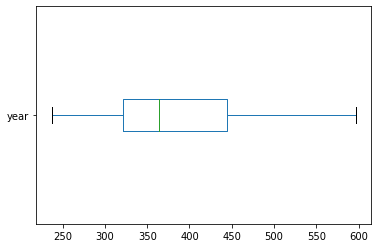

In [30]:
raw_data["year"].value_counts().sort_index().plot.box(vert = False)

### Drop incomplete years

In [31]:

raw_data.drop(raw_data[raw_data['year'] == 1958].index, inplace = True)
raw_data.drop(raw_data[raw_data['year'] == 2021].index, inplace = True)

In [32]:
raw_data.shape

(23919, 21)

In [33]:
raw_data["year"].value_counts().sort_index()

1959    362
1960    400
1961    488
1962    481
1963    482
       ... 
2016    408
2017    432
2018    556
2019    563
2020    484
Name: year, Length: 62, dtype: int64

### Dummy Coding

In [34]:
dummy = pd.get_dummies(raw_data
                       , prefix_sep='_'
                       , columns=['mode','season'])

In [35]:
dummy.head()

,weekid,song,performer,weeks_on_chart,peak_position,spotify_track_duration_ms,key,loudness,speechiness,acousticness,...,top_ten,long_lasting,decade,year,mode_False,mode_True,season_fall,season_spring,season_summer,season_winter
0,2009-12-26,My Life Would Suck Without You,Glee Cast,0.0,0.505051,0.059719,0.818182,0.717193,0.0348,0.01770,...,0,0,2000,2009,0,1,0,0,0,1
1,2014-01-04,I Have Nothing,Tessanne Chin,0.0,0.505051,0.066062,0.818182,0.808450,0.0338,0.23500,...,0,0,2010,2014,1,0,0,0,0,1
4,2019-06-01,I Think,"Tyler, The Creator",0.0,0.505051,0.059789,0.727273,0.652650,0.0801,0.00881,...,0,0,2010,2019,1,0,0,0,1,0
5,2019-09-07,I Think He Knows,Taylor Swift,0.0,0.505051,0.047122,0.000000,0.659642,0.0569,0.00889,...,0,0,2010,2019,0,1,1,0,0,0
6,2020-05-16,Losses,Drake,0.0,0.505051,0.079192,0.090909,0.680881,0.3510,0.28000,...,0,0,2020,2020,1,0,0,1,0,0


### Drop Final Columns
Keep only those for classification

In [36]:
final_data = dummy.drop(['weekid' ,'song','performer','long_lasting','top_ten','decade']
                     ,axis=1)

In [37]:
final_data.shape

(23919, 19)

In [38]:
#Export final dataset
final_data.to_csv(r'/Users/lcags/Documents/Practicum2/DATA/final_dataset.csv'
                ,index = False
                ,header=True)

# Resources

* https://www.datasciencemadesimple.com/create-frequency-table-of-column-in-pandas-python-2/
* https://www.geeksforgeeks.org/drop-rows-from-the-dataframe-based-on-certain-condition-applied-on-a-column/
* https://www.marsja.se/how-to-use-pandas-get_dummies-to-create-dummy-variables-in-python/
* https://data.world/kcmillersean/billboard-hot-100-1958-2017